# Taylor Swift data analysis finale

In [1]:
from ipywidgets import interact
from ipywidgets import *
import seaborn as sns

# dataset from https://www.kaggle.com/datasets/jarredpriester/taylor-swift-spotify-dataset
# Note that the file has a corrupted apostrophe encoding. I've fixed that for my dataset. 
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
total_records = pd.read_csv('taylor_swift_spotify.csv')
# Let's rename some of the albums so that it will get easier later on. 
total_records = total_records.replace('THE TORTURED POETS DEPARTMENT', 'TTPD', regex=True)
total_records = total_records.replace('THE ANTHOLOGY', 'The anthology', regex=True)
total_records['album'] = total_records['album'].replace({'Taylor Swift (Deluxe Edition)':'Taylor Swift'})
total_records['album'] = total_records['album'].replace({'Fearless (Platinum Edition)':'Fearless'})
print(total_records.info())
print(total_records.describe())
#print(total_records['album'].unique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582 entries, 0 to 581
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        582 non-null    int64  
 1   name              582 non-null    object 
 2   album             582 non-null    object 
 3   release_date      582 non-null    object 
 4   track_number      582 non-null    int64  
 5   id                582 non-null    object 
 6   uri               582 non-null    object 
 7   acousticness      582 non-null    float64
 8   danceability      582 non-null    float64
 9   energy            582 non-null    float64
 10  instrumentalness  582 non-null    float64
 11  liveness          582 non-null    float64
 12  loudness          582 non-null    float64
 13  speechiness       582 non-null    float64
 14  tempo             582 non-null    float64
 15  valence           582 non-null    float64
 16  popularity        582 non-null    int64  
 1

For this exercise, I will neglect any Taylor's version albums and concentrate only on the Big Machine versions for simplicity. Sometime in the future, I'll return to analyse the differences between the BM and TV albums. 

In [2]:
# filter the rows that contain the substring, this is to remove entries which aren't original albums but special renditions and such
substring = ['Deluxe','Disney', 'Live','Stadium','delux','International','Piano'\
             , 'Version', 'anthology', '3am', 'Dawn']
pattern = '|'.join(substring)

filter = total_records['album'].str.contains(pattern) 
filtered_df = total_records[~filter]

filtered_df = filtered_df.drop(columns = ['uri','track_number','id','Unnamed: 0','release_date'])
print(filtered_df.groupby(['album']).size().sum())

170


In [3]:
album_summary=pd.DataFrame()
album_summary['album']=filtered_df.groupby(['album'])['speechiness'].min().keys()
album_summary['size']=list(filtered_df.groupby(['album']).size())
album_summary['speechiness_min']=list(filtered_df.groupby(['album'])['speechiness'].min())
album_summary['speechiness_max']=list(filtered_df.groupby(['album'])['speechiness'].max())
album_summary['loudness_min']=list(filtered_df.groupby(['album'])['loudness'].min())
album_summary['loudness_max']=list(filtered_df.groupby(['album'])['loudness'].max())
album_summary['total_duration_ms']=list(filtered_df.groupby(['album'])['duration_ms'].sum())
album_summary['total_duration_HMS'] = pd.to_datetime(album_summary['total_duration_ms'], unit='ms').dt.strftime('%H:%M:%S:%f').str[:-3] 
album_summary['mean_popularity'] =  list(filtered_df.groupby(['album'])['popularity'].mean())

## Interactive summary plots

I wanted to have two different ways to visualise the data. One is the summary of the features and another one is the distribution. While the summary is useful to get a global overview, it does not tell me how the data is distributed. So I now have options to look at the data as a bar chart or as a violin plot. The violin plot let's me visualise the PDF of the data which I find very useful.

I also realised that plotting the log of acoustics and speechiness might be a good idea. 

In [4]:
from IPython.display import display

criteria = ['size', 'total_duration_ms', 'speechiness', 'loudness','popularity']
criteria2 = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'duration_ms']

critdict={'violinplot':criteria2,'barplot':criteria}

plottype_dropdown = Dropdown(options=critdict.keys(), description = "Plot type", disabled = False )
criteria_dropdown = Dropdown(options=criteria2, description = "Variable", disabled = False)

def update_criteria(plottype): 
    criteria_dropdown.options = critdict.get(plottype)

plottype_dropdown.observe(lambda change:update_criteria(change.new), names="value")    

def draw_barplot(variable):      
    temp_df=pd.DataFrame()
    temp_df['album']=album_summary['album'].astype(str)
    temp_df['size']=album_summary['size']
    temp_df['total_duration_ms']=album_summary['total_duration_ms']
    temp_df['speechiness']= abs(album_summary['speechiness_min']-album_summary['speechiness_max'])
    temp_df['loudness']= abs(album_summary['loudness_min'])-abs(album_summary['loudness_max'])
    temp_df['popularity']= album_summary['mean_popularity']
    temp_df = temp_df.sort_values(by=variable, ascending=False)
    p=sns.barplot(data=temp_df, y='album', x=variable)#, palette="Blues")
    p.set(ylabel=None)
    return 0
        
def draw_violin(variable):
    global filtered_df
    sns.set_theme(rc={'figure.figsize':(10,6)}, style = 'white')
    filtered_df = filtered_df.sort_values(by=variable, ascending=False)
    p=sns.violinplot(data = filtered_df, y=variable, x='album', palette="Blues")#, palette=color_palette)
    p.set_xticks(p.get_xticks());
    p.set_xticklabels(p.get_xticklabels(), rotation=90)
    if variable == 'instrumentalness': plt.yscale('log')
    if variable == 'speechiness': plt.yscale('log')
    p.set(xlabel=None)
    return 0

def update_plot(variable, plot_type):
    if variable == None or plot_type == None: print('must choose what to plot'); return 0
    if plot_type == 'barplot': draw_barplot(variable)
    if plot_type == 'violinplot': draw_violin(variable)

# Create an interactive plot widget that triggers on both dropdowns' changes

interactive_plot = interactive(
    update_plot, 
    plot_type=plottype_dropdown, 
    variable=criteria_dropdown
)

# Display the widgets and the interactive plot
display(interactive_plot)



interactive(children=(Dropdown(description='Variable', options=('acousticness', 'danceability', 'energy', 'ins…

In [18]:
def update_plot_test(*args):
    with output_plot:
        output_plot.clear_output(wait=True)  # Clear the previous plot, wait = True clears only when new output is availabel
        variable = criteria_dropdown.value
        plot_type = plottype_dropdown.value
        if plot_type == 'barplot': 
            temp_df = pd.DataFrame()
            temp_df['album'] = album_summary['album'].astype(str)
            temp_df['size'] = album_summary['size']
            temp_df['total_duration_ms'] = album_summary['total_duration_ms']
            temp_df['speechiness'] = abs(album_summary['speechiness_min'] - album_summary['speechiness_max'])
            temp_df['loudness'] = abs(album_summary['loudness_min']) - abs(album_summary['loudness_max'])
            temp_df['popularity'] = album_summary['mean_popularity']
            temp_df = temp_df.sort_values(by = variable, ascending = False)
            p = sns.barplot(data = temp_df, y = 'album', x = variable)#, palette = "Blues")
            p.set(ylabel=None)
            plt.show() # for clear_output to work, you must have plt.show()
        if plot_type == 'violinplot': 
            global filtered_df
            sns.set_theme(rc={'figure.figsize':(10,6)}, style = 'white')
            filtered_df = filtered_df.sort_values(by=variable, ascending=False)
            p=sns.violinplot(data = filtered_df, y=variable, x='album', palette="Blues")#, palette=color_palette)
            p.set_xticks(p.get_xticks());
            p.set_xticklabels(p.get_xticklabels(), rotation=90)
            if variable == 'instrumentalness': plt.yscale('log')
            if variable == 'speechiness': plt.yscale('log')
            p.set(xlabel=None)
            plt.show()# for clear_output to work, you must have plt.show()
        
# Create an output widget for displaying the plot
output_plot = widgets.Output()

# Create an interactive plot widget that triggers on both dropdowns' changes
criteria_dropdown.observe(lambda change:update_plot_test(), names = 'value')

# Use HBox to display the dropdowns side by side
dropdowns_layout = HBox([plottype_dropdown, criteria_dropdown])

# Display the widgets and the interactive plot
display(VBox([dropdowns_layout, output_plot]))

## Basic distribution plots to understand features

From the pair plots below, I see that acousticness is an approximately bimodal distribution. It should be farily easy to cluster the data to predict acousticness I think. If we look at the row for acousticness, we do see that the data is approximately clustered in two classes across all variables. No specific clusters are otherwise visible. 

/var/folders/zf/vn2shr2j6x9_qkg68dw_nk4c0000gn/T/ipykernel_49840/4229710538.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df_temp['instrumentalness'] = filtered_df['instrumentalness'].apply(lambda x: np.log(x) if x > 0 else x)
/var/folders/zf/vn2shr2j6x9_qkg68dw_nk4c0000gn/T/ipykernel_49840/4229710538.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df_temp['speechiness'] = filtered_df['speechiness'].apply(lambda x: np.log(x) if x > 0 else x)


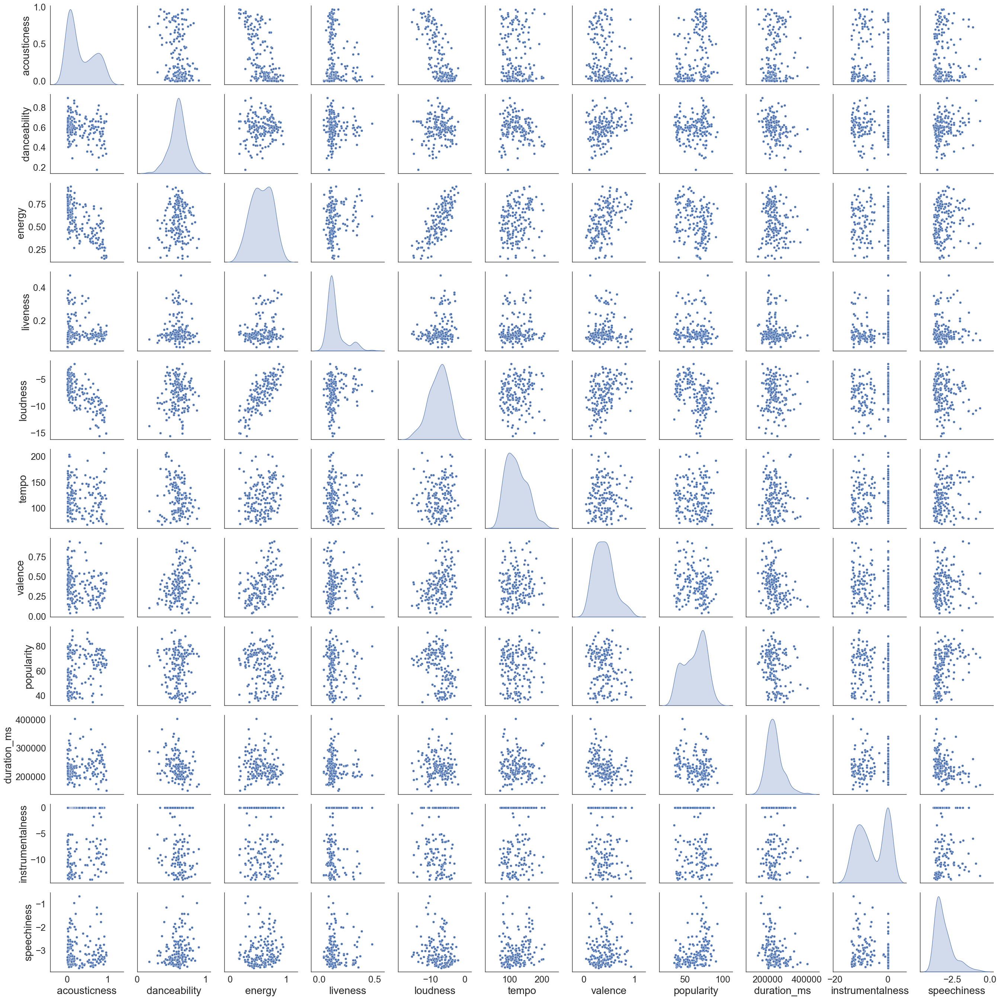

In [6]:
sns.set_context("paper", font_scale=2, rc={"axes.labelsize":20})


filtered_df_temp = filtered_df[['acousticness', 'danceability', 'energy', 'liveness', \
                                'loudness', 'tempo', 'valence', 'popularity','duration_ms']]
                                     
filtered_df_temp['instrumentalness'] = filtered_df['instrumentalness'].apply(lambda x: np.log(x) if x > 0 else x)
filtered_df_temp['speechiness'] = filtered_df['speechiness'].apply(lambda x: np.log(x) if x > 0 else x)

sns.pairplot(filtered_df_temp, diag_kind='kde')

Filtering and plotting the data per album gives me more colorful plots but no clear clustering across albums. However if you've heard of her music as much as I have you can tell that albums have specific themes. e.g. Lover is much more soft and mellow and reputation is very metal like. I want to try and find out if one can tell the albums apart in some other dimensional space based on available data. I won't be using e.g release date because that makes the problem much more obvious.  

/var/folders/zf/vn2shr2j6x9_qkg68dw_nk4c0000gn/T/ipykernel_49840/1729854225.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df_temp['instrumentalness'] = filtered_df['instrumentalness'].apply(lambda x: np.log(x) if x > 0 else x)


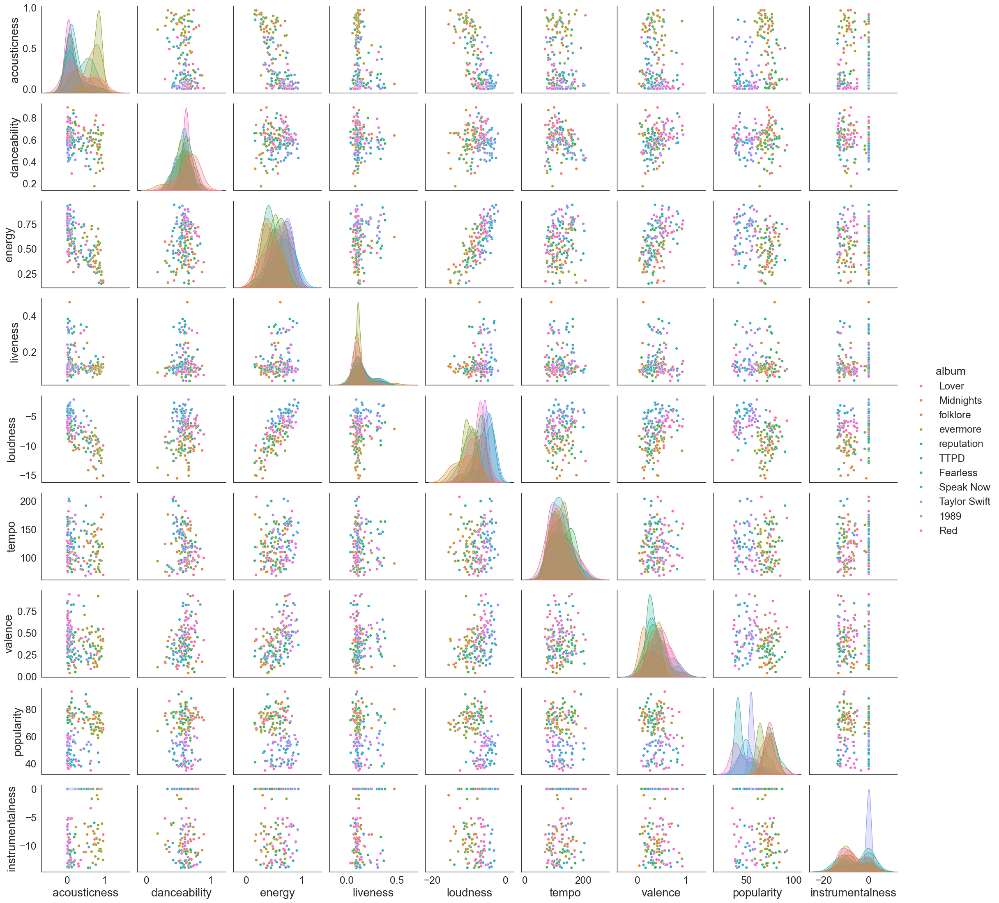

In [7]:
sns.set_context("paper", font_scale=2, rc={"axes.labelsize":20})
                                     
filtered_df_temp = filtered_df[['album','acousticness', 'danceability', 'energy', 'liveness', \
                                'loudness', 'tempo', 'valence', 'popularity']]
                                     
filtered_df_temp['instrumentalness'] = filtered_df['instrumentalness'].apply(lambda x: np.log(x) if x > 0 else x)

sns.pairplot(filtered_df_temp, diag_kind='kde',hue='album')

## Clustering exercise 101

### Clustering using KMeans

#### First we try to check if KMeans is any good to predict the album

##### Step 1

Tutorial followed from here:
https://realpython.com/k-means-clustering-python/

I will compute some well known quantities to evaluate if the choice of clustering parameters was good.

- **Silhoutte Coefficient** This indicates if a given data point belongs to the cluster it was classified into. This is computed by analysing how close the data point is to other points in it's own cluster and how far away it is from points in other clusters. The coefficient should be close to one as much possible. It does not use any knowledge of assigned labels or truth labels. 


- **Inertia** Inertia is defined as sum of squared distances between data points and the cluster centroid. It is a measure of how tightly packed the cluster is. Inertia should be as low as possible. It is **not** a measure of how separated the clusters are. Inertia can only be used for centroid based clustering algorithms. 
*Note* Use the *elbow method* together with your knowledge of field/data to choose the optimal number of clusters. 


- **Adjusted rand index** This uses _true cluster assignments_ to measure the similarity and predicted scores. _You must know the true labels to use this_.

_Tip_: use inertia method to determine the number of clusters and then use silhoutte coefficient to validate it.

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.mixture import GaussianMixture as GMM
from sklearn import metrics

Playing around to check if one can predict album given the song. My preliminary attempt tells me that this is a bad idea. This is another problem I want to return to in the future.

In [9]:
true_label_names = filtered_df['album']
label_encoder = LabelEncoder()
true_labels = label_encoder.fit_transform(true_label_names)
n_clusters = len(label_encoder.classes_)

filtered_df_temp = filtered_df[['acousticness', 'danceability', 'energy', 'liveness', \
                                'loudness', 'tempo', 'valence', 'popularity']]
                                     
#filtered_df_temp['instrumentalness'] = filtered_df['instrumentalness'].apply(lambda x: np.log(x) if x > 0 else x)
#filtered_df_temp['speechiness'] = filtered_df['speechiness'].apply(lambda x: np.log(x) if x > 0 else x)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(filtered_df_temp)
kmeans = KMeans(n_clusters=6, init="k-means++", n_init=11, max_iter=100,)
kmeans.fit(X_scaled)

predicted_labels = kmeans.labels_

adjusted_rand_score(true_labels, predicted_labels)

0.08540574847125018

I can however cluster the songs and try to identify how many 'categories' are there. For this I compute the inertia and check where the optimal number of clusters are. 

##### Step 2

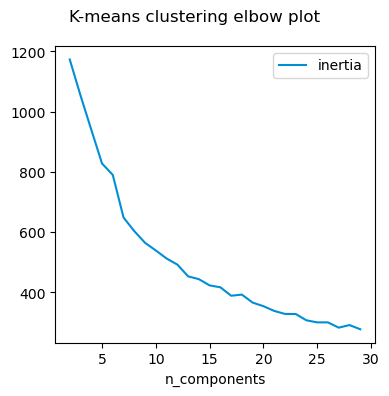

In [10]:
import gc
gc.collect()
plt.rcdefaults()
true_label_names = filtered_df['album']

def get_inertia(df, min_cluster, max_cluster):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df)
    inertia_scores = []
    for n in range(min_cluster, max_cluster):
        
        # This set the number of components for pca,
        # but leaves other steps unchanged
        kmeans = KMeans(n_clusters=n, init="k-means++", n_init=5, max_iter=500,)
        kmeans.fit(X_scaled)

        inertia = kmeans.inertia_

        inertia_scores.append(inertia)
    return inertia_scores

# Empty lists to hold evaluation metrics

inertia_scores = []

max_cluster = 30
min_cluster = 2

#plt.style.use("fivethirtyeight")
plt.figure(figsize=(4, 4))

filtered_df_temp = filtered_df[['acousticness','danceability', 'energy', 'liveness', \
                                'loudness', 'tempo', 'valence',  'speechiness', 'instrumentalness']]
plt.plot(range(min_cluster, max_cluster),get_inertia(filtered_df_temp, min_cluster, max_cluster),\
         c="#008fd5",label="inertia",)

plt.xlabel("n_components")
plt.legend()
plt.suptitle("K-means clustering elbow plot")
plt.tight_layout()
plt.show()

What happens if I select different features to cluster on? It seems to me that except in extreme situation, the number of clusters do not change. From what I understand, even if the absolute values of the inertia metric changes, it is not relevant for the optimisation process itself. 

/var/folders/zf/vn2shr2j6x9_qkg68dw_nk4c0000gn/T/ipykernel_49840/3691018408.py:56: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


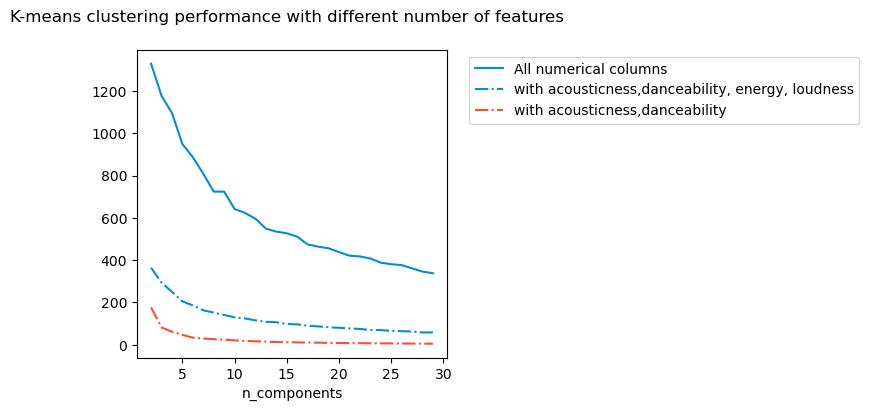

In [11]:
import gc
gc.collect()
plt.rcdefaults()
true_label_names = filtered_df['album']

def get_inertia(df, min_cluster, max_cluster):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df)

    inertia_scores = []
    for n in range(min_cluster, max_cluster):
        # This set the number of components for pca,
        # but leaves other steps unchanged

        kmeans = KMeans(n_clusters=n, init="k-means++", n_init=5, max_iter=500,)
        kmeans.fit(X_scaled)

        inertia = kmeans.inertia_

        inertia_scores.append(inertia)
    return inertia_scores


# Empty lists to hold evaluation metrics
inertia_scores = []

max_cluster = 30
min_cluster = 2


#plt.style.use("fivethirtyeight")
plt.figure(figsize=(4, 4))
#plt.plot(range(min_cluster, max_cluster),inertia_scores,c="#008fd5",label="inertia",)

filtered_df_temp = filtered_df[['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity']]

plt.plot(range(min_cluster, max_cluster),get_inertia(filtered_df_temp, min_cluster, max_cluster),\
         c="#008fd5",label="All numerical columns",linestyle = '-')

filtered_df_temp = filtered_df[['acousticness','danceability', 'energy', 'loudness']]


plt.plot(range(min_cluster, max_cluster),get_inertia(filtered_df_temp, min_cluster, max_cluster),\
         c="#008fd5",label="with acousticness,danceability, energy, loudness",linestyle = '-.')

filtered_df_temp = filtered_df[['acousticness','popularity']]


plt.plot(range(min_cluster, max_cluster),get_inertia(filtered_df_temp, min_cluster, max_cluster),\
         c="#fc4f30",label="with acousticness,danceability",linestyle = '-.')

plt.xlabel("n_components")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.suptitle("K-means clustering performance with different number of features")
plt.tight_layout()
plt.show()

Do I need all the features I am using? For this, I use different types of methods including
* reject correlated data
* select data with variance smaller than some threshold 
* use PCA to choose features based on variance

For this particular example, it seems it does not matter which way I compute the inertia, I get about 5 - 7 clusters.

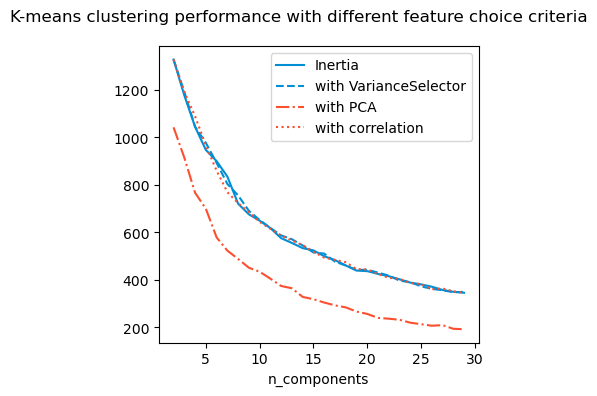

In [12]:
import gc
gc.collect()
plt.rcdefaults()
true_label_names = filtered_df['album']

def correlation_selector(data_scaled, threshold):
    import numpy as np

    # Compute correlation matrix
    corr_matrix = pd.DataFrame(data_scaled).corr().abs()
    corr = corr_matrix.unstack()
    corrtest = corr.copy()
    corrtest.sort_values(ascending=True, inplace = True)
    
    # Identify columns with high correlation (e.g., > 0.9)
    to_drop = [(col1, col2) for col1, col2 in corrtest.index if corrtest[col1,col2] > threshold and col1 != col2]
    data_selected = data_scaled[:, [i for i in range(data_scaled.shape[1]) if i not in to_drop]]

    return data_selected

def variance_selector(data_scaled, threshold):
    from sklearn.feature_selection import VarianceThreshold
    selector = VarianceThreshold(threshold=threshold)  # Adjust threshold as needed
    data_selected = selector.fit_transform(data_scaled)

    return data_selected

def variance_selector_PCA(data_scaled, threshold):
    ''' PCA with 0 < n_components < 1 selects features with variance = n_components '''
    from sklearn.decomposition import PCA
    pca = PCA(n_components = threshold)  # Adjust threshold as needed
    data_selected = pca.fit_transform(data_scaled)

    return data_selected

def get_inertia(df, min_cluster, max_cluster):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df)
    X_scaled_var = variance_selector(X_scaled, 0.8)
    X_scaled_pca = variance_selector_PCA(X_scaled, 0.8)
    X_scaled_corr = correlation_selector(X_scaled, 0.8)
    inertia_scores = []
    inertia_scores_pca = []
    inertia_scores_var = []
    inertia_scores_corr = []
    for n in range(min_cluster, max_cluster):
        # This set the number of components for pca,
        # but leaves other steps unchanged
        kmeans = KMeans(n_clusters=n, init="k-means++", n_init=5, max_iter=500,)
        
        kmeans.fit(X_scaled)
        inertia_scores.append(kmeans.inertia_)
        
        kmeans.fit(X_scaled_var)
        inertia_scores_var.append(kmeans.inertia_)
        
        kmeans.fit(X_scaled_pca)
        inertia_scores_pca.append(kmeans.inertia_)
        
        kmeans.fit(X_scaled_corr)
        inertia_scores_corr.append(kmeans.inertia_)
        
    return [inertia_scores, inertia_scores_var, inertia_scores_pca, inertia_scores_corr]

# Empty lists to hold evaluation metrics

inertia_scores = []

max_cluster = 30
min_cluster = 2

#plt.style.use("fivethirtyeight")
plt.figure(figsize=(4, 4))
#plt.plot(range(min_cluster, max_cluster),inertia_scores,c="#008fd5",label="inertia",)

filtered_df_temp = filtered_df[['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity']]


inertia, inertia_var, inertia_pca, inertia_corr = get_inertia(filtered_df_temp, min_cluster, max_cluster)
plt.plot(range(min_cluster, max_cluster),inertia,\
         c="#008fd5",label="Inertia",linestyle = '-')

plt.plot(range(min_cluster, max_cluster),inertia_var,\
         c="#008fd5",label="with VarianceSelector",linestyle = '--')

plt.plot(range(min_cluster, max_cluster),inertia_pca,\
         c="#fc4f30",label="with PCA",linestyle = '-.')

plt.plot(range(min_cluster, max_cluster),inertia_corr,\
         c="#fc4f30",label="with correlation",linestyle = ':')

plt.xlabel("n_components")
#plt.legend(bbox_to_anchor=(1.05, 1))
plt.legend()
plt.suptitle("K-means clustering performance with different feature choice criteria")
plt.tight_layout()
plt.show()

It seems that irrespective of the methods used, there are about 5-7 clusters. I will visualise them and compute Silhoutte index for these.

The Silhoutte index isn't particularly high but I think it is the best I can do.

Below we try to visualise the cluster. However I find this a meaningless exercise since the PCA visualisation shows no interesting clusters.

In [28]:
from sklearn.metrics import silhouette_score
scaler = StandardScaler()
X_scaled = scaler.fit_transform(filtered_df_temp)
kmeans = KMeans(n_clusters = 5)
silhouette_score(X_scaled, kmeans.fit_predict(X_scaled))

np.float64(0.16518709591929348)

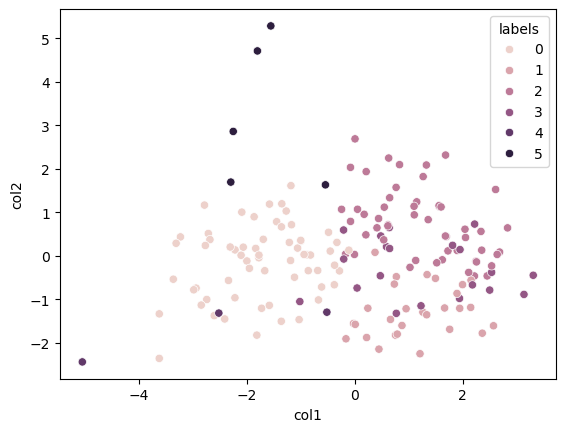

In [13]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(filtered_df_temp)
pca = PCA(n_components = 2)
kmeans = KMeans(n_clusters = 6)
kmeans.fit(X_scaled)
data_pca = pca.fit_transform(X_scaled)
data_visual_df = pd.DataFrame(data_pca, columns = ['col1', 'col2'])
data_visual_df['labels'] = kmeans.labels_
sns.scatterplot(data = data_visual_df, x = 'col1', y = 'col2' , hue = 'labels' )
filtered_df['labels'] = kmeans.labels_
#print(filtered_df.head())
#print(filtered_df[(filtered_df["labels"]==2) ])
#filtered_df[(filtered_df["labels"] == 0 ) & (filtered_df['album'] == '1989')]


### Song prediction
Given an album and a song within that album the following will suggest 10 closest songs to the choice made. The suggestions may not be from the same album. 

In [14]:
from sklearn.metrics.pairwise import euclidean_distances

def get_suggestions(selected_song):
    member_index = filtered_df.index[filtered_df['name'] == selected_song].tolist()[0]

    cluster_id = filtered_df.loc[member_index, 'labels']
    same_cluster_data = filtered_df[filtered_df['labels'] == cluster_id]

    if len(same_cluster_data) < 11: 
        suggestions = list(filtered_df[filtered_df['labels'] == cluster_id]['name'])
    else:
        numeric_cols = same_cluster_data.select_dtypes(include = ['number']).columns
        numeric_vals = same_cluster_data.select_dtypes(include = ['number']).values

        # Compute distances between the selected member and others
        selected_member_data = numeric_vals[same_cluster_data.index.get_loc(member_index)].reshape(1, -1)
        distances = euclidean_distances(selected_member_data, numeric_vals).flatten()

        nearest_indices = np.argsort(distances)[1:11]

        nearest_members = same_cluster_data.iloc[nearest_indices]

        # Display or save the results
        suggestions = nearest_members['name'].tolist()
    return suggestions 

selected_song = 'Anti-Hero'
print(get_suggestions(selected_song))

['Holy Ground', 'Stay Stay Stay', 'Bejeweled', 'I Wish You Would', 'All You Had To Do Was Stay', '...Ready For It?', 'ME! (feat. Brendon Urie of Panic! At The Disco)', 'We Are Never Ever Getting Back Together', 'Gorgeous', 'The Man']


In [17]:
album_dropdown = Dropdown(options = filtered_df['album'].unique(), description = 'Album Name')
song_dropdown = Dropdown(options = ['select a song'], description = 'Song')

suggestions_output = Output()

def change_songs(change):
    song_dropdown.options = list(filtered_df[filtered_df['album'] == change['new']]['name'])
    
def get_songs(change):
    from tabulate import tabulate
    with suggestions_output:
        suggestions_output.clear_output(wait=True)
        print("You may also like")
        print("")
        suggestion_list = []
        for song in get_suggestions(change['new']): 
            if song == song_dropdown.value: continue
            suggestion_list.append([song, list(filtered_df[filtered_df['name'] == song]['album'])[0]])
        print(tabulate(suggestion_list, headers=['Name', 'Album']))
        
    
album_dropdown.observe(change_songs, names = 'value')
song_dropdown.observe(get_songs, names = 'value')
hbox = widgets.HBox([album_dropdown, song_dropdown])
display(hbox, suggestions_output)

Output()